# Final Project
This Notebook Describes results in "Olympic Player Profile" Sections

In [3]:
import pandas as pd
import numpy as np

In [4]:
economic_data = pd.read_csv("world_bank_data.csv", header = 0)
economic_data.drop(economic_data.tail(1).index,inplace=True) # drop last n rows

In [5]:
from collections import defaultdict
economic_data_dict = defaultdict(list) #we will use country as key, year as other key then list all the data 

#extract years
years = []
for data in economic_data:
    data = data[0:4]
    years.append(data)
years = years[4:]

#extract series
series_info = []
prev_country = ""
for index, row in economic_data.iterrows():
    country_name = row[0]
    if country_name != prev_country and index != 0:
        break
    series_name = row[2]
    series_code = row[3]
    series_info.append((series_name, series_code))
    prev_country = country_name

#populate dict
for index, row in economic_data.iterrows():
    country_name = row[0]

    for i, year in enumerate(years):
        year_data_point = row[i+4]
        dict_key = (country_name,year)
        economic_data_dict[dict_key].append(year_data_point)

In [282]:
series_info

[('Adolescent fertility rate (births per 1,000 women ages 15-19)',
  'SP.ADO.TFRT'),
 ('Agriculture, forestry, and fishing, value added (% of GDP)',
  'NV.AGR.TOTL.ZS'),
 ('Annual freshwater withdrawals, total (% of internal resources)',
  'ER.H2O.FWTL.ZS'),
 ('Births attended by skilled health staff (% of total)', 'SH.STA.BRTC.ZS'),
 ('CO2 emissions (metric tons per capita)', 'EN.ATM.CO2E.PC'),
 ('Contraceptive prevalence, any methods (% of women ages 15-49)',
  'SP.DYN.CONU.ZS'),
 ('Domestic credit provided by financial sector (% of GDP)',
  'FS.AST.DOMS.GD.ZS'),
 ('Electric power consumption (kWh per capita)', 'EG.USE.ELEC.KH.PC'),
 ('Energy use (kg of oil equivalent per capita)', 'EG.USE.PCAP.KG.OE'),
 ('Exports of goods and services (% of GDP)', 'NE.EXP.GNFS.ZS'),
 ('External debt stocks, total (DOD, current US$)', 'DT.DOD.DECT.CD'),
 ('Fertility rate, total (births per woman)', 'SP.DYN.TFRT.IN'),
 ('Foreign direct investment, net inflows (BoP, current US$)',
  'BX.KLT.DINV.CD.WD'

In [7]:
athlete_data = pd.read_csv("athlete_events.csv", header = 0)

In [8]:
acronym_data = pd.read_csv("noc_regions.csv", header = 0)

In [9]:
#used for converting country acronym into country full spelling 
set_of_acronym = set(athlete_data["NOC"])
acronym_to_country = {}
for index, row in acronym_data.iterrows():
    acro = row[0]
    name = row[1]
    acronym_to_country[acro] = name

In [11]:
world_bank_countries = set([country_name for country_name,_ in economic_data_dict.keys()])
olympic_countries = set(acronym_to_country.values())
difference_one = olympic_countries-world_bank_countries
difference_two = world_bank_countries-olympic_countries

In [12]:
#OVERRIDE EXPLICITLY TO MATCH WORLD BANK DATA SET
acronym_to_country["USA"] = "United States"
acronym_to_country["KOR"] = "Korea, Rep."
acronym_to_country["VEN"] = "Venezuela, RB"
acronym_to_country["LCA"] = "St. Lucia"
acronym_to_country["ISV"] = "Virgin Islands (U.S.)"
acronym_to_country["IVB"] = "British Virgin Islands"
acronym_to_country["GBR"] = "United Kingdom"
acronym_to_country["TTO"] = "Trinidad and Tobago"
acronym_to_country["BRU"] = "Brunei Darussalam"
acronym_to_country["GAM"] = "Gambia, The"
acronym_to_country["BAH"] = "Bahamas, The"
acronym_to_country["COD"] = "Congo, Dem. Rep."
acronym_to_country["CGO"] = "Congo, Rep."
acronym_to_country["IRI"] = "Iran, Islamic Rep."
acronym_to_country["MKD"] = "North Macedonia"
acronym_to_country["CPV"] = "Cabo Verde"
acronym_to_country["PRK"] = "Korea, Dem. People’s Rep."
acronym_to_country["ANT"] = "Antigua and Barbuda"
acronym_to_country["SYR"] = "Syrian Arab Republic"
acronym_to_country["EUN"] = "Russian Federation"
acronym_to_country["RUS"] = "Russian Federation"
acronym_to_country["URS"] = "Russian Federation"
acronym_to_country["EGY"] = "Egypt, Arab Rep."
acronym_to_country["YAR"] = "Yemen, Rep."
acronym_to_country["YEM"] = "Yemen, Rep."
acronym_to_country["YMD"] = "Yemen, Rep."
acronym_to_country["VIN"] = "St. Vincent and the Grenadines"
acronym_to_country["BOL"] = "Bolivia"
acronym_to_country["SKN"] = "St. Kitts and Nevis"

In [324]:
"Syria" in acronym_to_country.keys()

False

In [13]:

#sanitize the olympic data
relevant_columns = ['ID', 'Name', 'Sex', 'Height', 'Weight', 'NOC', 'Year', 'Season', 'Sport', 'Medal']
groupby_columns = ['ID', 'Name','Sex', 'Height', 'Weight', 'NOC', 'Year', 'Season', 'Sport']
athlete_data = athlete_data[relevant_columns]
athlete_data = athlete_data.loc[athlete_data.Year >= 1960, :]
athlete_data = athlete_data.loc[athlete_data.Season == "Summer"]
athlete_data.Medal = athlete_data.Medal.fillna("None")
cleaned_data = athlete_data[groupby_columns]
cleaned_data_final = cleaned_data.groupby(['ID', 'Name', 'Sex', 'Height', 'Weight', 'NOC', 'Year', 'Sport']).size().reset_index()

In [14]:
sport_to_index = {}
sports_names = list(set(athlete_data["Sport"].values))
for i in range(0, len(sports_names)):
    sport_to_index[sports_names[i]] = i

#group some to reduce dimensionality for hisotram
def one_hot_encode_sport(sport_name):
    index = sport_to_index[sport_name]
    new_list = []
    for i in range(0, len(sports_names)):
        if i == index:
            new_list.append(1)
        else:
            new_list.append(0)

    return new_list

In [15]:
sports_names

['Softball',
 'Fencing',
 'Weightlifting',
 'Athletics',
 'Tennis',
 'Equestrianism',
 'Sailing',
 'Triathlon',
 'Rhythmic Gymnastics',
 'Rugby Sevens',
 'Wrestling',
 'Trampolining',
 'Volleyball',
 'Modern Pentathlon',
 'Rowing',
 'Football',
 'Archery',
 'Boxing',
 'Baseball',
 'Basketball',
 'Canoeing',
 'Cycling',
 'Taekwondo',
 'Hockey',
 'Judo',
 'Synchronized Swimming',
 'Handball',
 'Badminton',
 'Gymnastics',
 'Golf',
 'Beach Volleyball',
 'Diving',
 'Table Tennis',
 'Shooting',
 'Swimming',
 'Water Polo']

In [16]:
from collections import defaultdict

olympic_data_dict_index = defaultdict(list) #we will use country as key, year as other key then list all the data which is a list of all atheletes 
#right now it will be list of indexes to use...
olympic_data_raw = []
counter_index = 0
for index, row in cleaned_data_final.iterrows(): 
    corresponding_df = athlete_data.loc[(athlete_data.ID == row['ID']) & (athlete_data.Year == row['Year']), :]
    no_medal_count = 0
    bronze_count = 0
    silver_count = 0
    gold_count = 0

    for index2, row2 in corresponding_df.iterrows():
        if row2['Medal'] == "None":
            no_medal_count += 1
        elif row2['Medal'] == "Bronze":
            bronze_count += 1
        elif row2['Medal'] == "Silver":
            silver_count += 1
        else:
            gold_count += 1

    row['No_Medal'] = no_medal_count
    row['Bronze'] = bronze_count
    row['Silver'] = silver_count
    row['Gold'] = gold_count

    #populate dict with info 
    country_acronym = row['NOC']
    
    if country_acronym not in acronym_to_country:
        continue 
    
    country = acronym_to_country[country_acronym]
    year = str(row['Year'])
    key_dict = (country,year)
    one_hot_encode_country = one_hot_encode_sport(row['Sport'])
    new_row = list(row.values) 
    male_female = 1 if new_row[2] == "M" else 0
    new_row = [male_female,new_row[3],new_row[4]] + one_hot_encode_country + [new_row[8],new_row[9],new_row[10],new_row[11],new_row[12]]
    olympic_data_raw.append(new_row)
    olympic_data_dict_index[key_dict].append(counter_index)
    counter_index += 1


#     TODO do we need that?
#     del corresponding_df


In [28]:
#run pca and construct dict 
import scprep
olympic_data_dict = {}
olympic_data_raw = np.array(olympic_data_raw)
#normalize each column 
olympic_data_raw_norm = olympic_data_raw / olympic_data_raw.max(axis=0)
olympic_data_reduced, s = scprep.reduce.pca(olympic_data_raw_norm, n_components=10, return_singular_values=True)

for key in olympic_data_dict_index:
    new_list = []
    for index in olympic_data_dict_index[key]:
        new_list.append(olympic_data_reduced[index])
    olympic_data_dict[key] = new_list

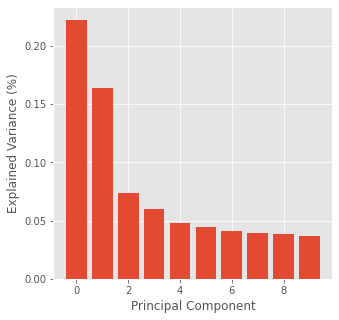

In [344]:
#GRAPH OF SINGULAR VALUES 

%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')

variance_arr = []
    
for i in range(0,len(s)):
    variance = (s[i]**2)/(len(olympic_data_raw)-1)
    variance_arr.append(variance)

fig = plt.figure(figsize = (5,5))
plt.bar(x=[i for i in range(0, len(s))], height=variance_arr)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance (%)')
plt.show()

In [20]:
len(olympic_data_dict.keys())

2206

In [21]:
#STORE HISTOGRAM FOR EACH KEY OF PLAYERS 
BIN_SIZE = 20 
olympic_data_dict_hist = {}
for key in olympic_data_dict:
    player_data = olympic_data_dict[key]
    hist_player, _ = np.histogram(player_data, bins=BIN_SIZE, density=True)
    olympic_data_dict_hist[key] = hist_player.flatten()

In [22]:
def plot_hist(country, year):
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.style.use('ggplot')

    hist_info = olympic_data_dict_hist[(country,year)]

    fig = plt.figure(figsize = (5,5))
    plt.bar(x=[i for i in range(0, len(hist_info))], height=hist_info)
    plt.xlabel('Bins')
    plt.ylabel('Value')
    plt.title(country + "," + year)
    plt.show()

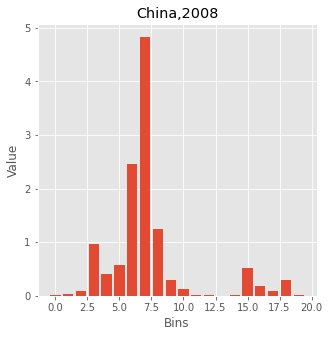

In [25]:
plot_hist('China', '2008') 

In [29]:
from pyemd import emd
#how should we make distance matrix 
#20 bins so

DISTANCE_MATRIX_EMD = np.zeros((BIN_SIZE, BIN_SIZE))

for i in range(0, BIN_SIZE):
    my_arr = []
    for j in range(i, -1, -1):
        my_arr.append(j)
    for j in range(1, BIN_SIZE-i):
        my_arr.append(j)
    DISTANCE_MATRIX_EMD[i] = my_arr

#emd(olympic_data_dict_hist[('Canada','2000')], olympic_data_dict_hist[('Canada','1996')], distance_matrix)

In [31]:
from tqdm import tqdm
PRE_COMPUTE_EMD = {}

def kmeans(X, k, nrep=5, itermax=300):
    """kmeans: cluster data into k partitions

    Args:
        X (n x d np.ndarray): input data, rows = points, cols = dimensions
        k (int): Number of clusters to partition
        nrep (int): Number of repetitions to average for final clustering 
        itermax (int): Number of iterations to perform before terminating
    Returns:
        labels (n x 1 np.ndarray): Cluster labels assigned by kmeans
    """
    N = X.shape[0]
    D = X.shape[1]
    set_of_labels = []
    set_of_centroids = []
    min_clustering = None
    min_dist = 1000000
    for full_iter in range(0, nrep):
        curr_centroids = kmeans_plusplus(X, k)  # find your initial centroids
        # perform kmeans
        prev_label = []
        for iteration in tqdm(range(0, itermax)): 
            
            curr_label = []
            for point in X: 
                dist_to_c = [(compute_distance(point, c), i) for i,c in enumerate(curr_centroids)]
                min_centroid = min(dist_to_c, key = lambda t: t[0])[1]    
                curr_label.append(min_centroid)
            
            if curr_label == prev_label:
                break 
                
            prev_label = curr_label 
            
            #update centroids
            new_centroids = np.zeros((k,D))
            num_points = np.zeros(k) 
            
            #calculate the number of points per cluster 
            for i,label in enumerate(curr_label):
                new_centroids[label] += X[i] #TODO: check if sequared distances
                num_points[label] += 1
            
            #compute new_centroid 
            for i in range(0, k):
                new_centroids[i] /= num_points[i]
                
            curr_centroids = new_centroids
            
        #compute min
        total_dist = 0
        for i, point in enumerate(X):
            centroid_index = prev_label[i]
            total_dist += compute_distance(point, curr_centroids[centroid_index])
            
        if total_dist < min_dist:
            min_dist = total_dist
            min_clustering = prev_label 
            
    labels = min_clustering 
    return labels

def compute_distance(a, b):
    key_a = (tuple(a), tuple(b))
    key_b = (tuple(b), tuple(a))
    if key_a in PRE_COMPUTE_EMD:
        return PRE_COMPUTE_EMD[key_a]
        
    res = emd(a, b, DISTANCE_MATRIX_EMD)
    PRE_COMPUTE_EMD[key_a] = res
    PRE_COMPUTE_EMD[key_b] = res
    return emd(a, b, DISTANCE_MATRIX_EMD)
#     return np.linalg.norm(a-b)**2

def compute_distance_V2(a, b):
    return np.linalg.norm(a-b)**2
    
def kmeans_plusplus(X, k):
    """kmeans_plusplus: initialization algorithm for kmeans
    Args:
        X (n x d np.ndarray): input data, rows = points, cols = dimensions
        k (int): Number of clusters to partition

    Returns:
        centroids (k x d np.ndarray): centroids for initializing k-means
    """
    #k clusters and each point has d dimensions so kXd
    N = X.shape[0]
    D = X.shape[1]
    
    ran_index = np.random.randint(0, N)
    x_1 = X[ran_index]
    
    centroids = np.zeros((k, D))
    centroids[0] = x_1
    
    #get next k-1 centriods 
    for i in range(1, k):
        
        sum_of_centroids_dist = 0 
        prob_dist = []
        for point in X:
            min_dist = 10000000
            
            for j in range(0, i):
                c = centroids[j]
                dist = compute_distance(c, point)
                if dist < min_dist:
                    min_dist = dist
                    
            sum_of_centroids_dist += min_dist 
            prob_dist.append(min_dist)
            
        prob_dist = [float(pro)/sum_of_centroids_dist for pro in prob_dist]
        n_index = np.random.choice(np.arange(0, len(prob_dist)), p=prob_dist)
        new_centroid = X[n_index]
        centroids[i] = new_centroid
    
    return centroids

In [300]:
def get_all_points():
    MATRIX_POINTS = np.zeros((len(list_of_country_year),BIN_SIZE))
    list_of_indexes = []
    for i in range(0, len(list_of_country_year)):
        key = list_of_country_year[i]
        MATRIX_POINTS[i] = olympic_data_dict_hist[key]
        list_of_indexes.append(i)
        
    return MATRIX_POINTS, list_of_indexes
    
    
def get_points_by_country(country_name):
    list_of_indexes = []
    for i in range(0, len(list_of_country_year)):
        key = list_of_country_year[i]
        if key[0] == country_name:
            list_of_indexes.append(i)
            
    MATRIX_POINTS = np.zeros((len(list_of_indexes),BIN_SIZE))

    for i in range(0, len(list_of_indexes)):
        key = list_of_country_year[list_of_indexes[i]]
        MATRIX_POINTS[i] = olympic_data_dict_hist[key] 

    return MATRIX_POINTS,list_of_indexes
    
def get_points_by_year(year):
    list_of_indexes = []
    for i in range(0, len(list_of_country_year)):
        key = list_of_country_year[i]
        if key[1] == year:
            list_of_indexes.append(i)
            
    MATRIX_POINTS = np.zeros((len(list_of_indexes),BIN_SIZE))

    for i in range(0, len(list_of_indexes)):
        key = list_of_country_year[list_of_indexes[i]]
        MATRIX_POINTS[i] = olympic_data_dict_hist[key] 

    return MATRIX_POINTS,list_of_indexes


from prettytable import PrettyTable
def print_clusters(cluster_labels, list_of_indexes):
    assert len(cluster_labels) == len(list_of_indexes)
    cluster_dict = defaultdict(list)
    for i in range(0, len(list_of_indexes)):
        index = list_of_indexes[i]
        cluster_id = cluster_labels[i]
        cluster_dict[cluster_id].append(list_of_country_year[index])
        
    max_length_column = 0 
    for key in cluster_dict:
        max_length_column = max(max_length_column, len(cluster_dict[key]))
        
    counter = 0
    my_table = PrettyTable()
    for key in cluster_dict:
        
        if counter % 3 == 0:
            print(my_table)
            my_table = PrettyTable()
        
        lst_of_countries = cluster_dict[key]
        lst_of_countries = sorted(lst_of_countries, key = lambda x: int(x[1]))
        lst_of_countries = sorted(lst_of_countries, key = lambda x: str(x[0]))
        
        for i in range(0,len(lst_of_countries)):
            lst_of_countries[i] = str(lst_of_countries[i][0])+"({})".format(lst_of_countries[i][1])
        
        num_null_pads = max_length_column-len(lst_of_countries)
        for i in range(num_null_pads):
            lst_of_countries.append("")
            
        my_table.add_column("Cluster:"+str(key),lst_of_countries)
        
        counter +=1 




In [335]:
from sklearn.manifold import TSNE
import phate

def get_phate_embeddings(karr, coords):
    
    embeddings = []
    for i, knn in tqdm(enumerate(karr)):
        phate_operator = phate.PHATE(k=knn, verbose=False) #nearest operator 
        embedding = phate_operator.fit_transform(coords)
        embeddings.append(embedding)
       
    return embeddings

def get_tsne_embeddings(p, coords):
    embeddings = []
    for i, perplex in tqdm(enumerate(p)):
        embedding = TSNE(n_components=2, perplexity = perplex).fit_transform(coords)
        embeddings.append(embedding)
       
    return embeddings

def color_embeddings_big(embeddings, colorings, titles, graph_titles, figsize):
    import matplotlib.pyplot as plt 
    plt.style.use('ggplot')    
    for i,coloring in enumerate(colorings):
        for j,embedding in enumerate(embeddings):
            fig = plt.figure(figsize = figsize)
            plt.scatter(embedding[:,0],embedding[:,1], c=coloring)
            plt.title(titles[i] + "," + graph_titles[j])
            plt.show()
            

def color_embeddings(embeddings, colorings, titles, graph_titles, default=True):
    import matplotlib.pyplot as plt 
    plt.style.use('ggplot')
    figsize = (40,40)
    if len(colorings) == 1:
        figsize = (20,5)
    
    if default:
        _, plots = plt.subplots(len(colorings), len(embeddings), dpi= 100, figsize = figsize)
    else:
        _, plots = plt.subplots(len(colorings), len(embeddings), figsize = (20,20))
        
    
    for i,coloring in enumerate(colorings):
        for j,embedding in enumerate(embeddings):
            if len(colorings) == 1:
                plots[j].scatter(embedding[:,0],embedding[:,1], c=coloring)
                plots[j].set_title(titles[0] + "," + graph_titles[j])
                continue 
            plots[i][j].scatter(embedding[:,0],embedding[:,1], c=coloring)
            plots[i][j].set_title(titles[i] + "," + graph_titles[j])

    plt.show()

In [144]:
from datapackage import Package
package = Package('https://datahub.io/JohnSnowLabs/country-and-continent-codes-list/datapackage.json')
# print list of all resources:
# print(package.resource_names)
csv_continent_data = None
# print processed tabular data (if exists any)
for resource in package.resources:
    if resource.descriptor['datahub']['type'] == 'derived/csv':
        csv_continent_data = resource.read()

In [165]:
#try different colorings 
def color_by_year(list_of_indexes):
    coloring = []
    dict_year = {}
    counter = 0 
    for index in list_of_indexes:
        key = list_of_country_year[index]
        if key[1] not in dict_year:
            dict_year[key[1]] = counter
            counter += 1
        coloring.append(dict_year[key[1]])
        
    return coloring, dict_year
        
def color_by_country(list_of_indexes):
    coloring = []
    dict_country = {}
    counter = 0 
    for index in list_of_indexes:
        key = list_of_country_year[index]
        if key[0] not in dict_country:
            dict_country[key[0]] = counter
            counter += 1
        coloring.append(dict_country[key[0]])
        
    return coloring, dict_country

def convert_country_to_cont(country):
    
    if isinstance(country, float):
        return "XX"
    
    contenders = [] 
    for row in csv_continent_data:
        count_name = row[2]
        num_char = int(float(len(count_name)/1.5))
        if country[0:num_char] in count_name:
            contenders.append((count_name, row[1]))

    if len(contenders) == 0:
#         print(country)
#         print("ERROR")
        return "XX"
    
    min_len = 1000
    min_cont = "XX"
    for country_guess, cont in contenders:
        if abs(len(country_guess)-len(country)) < min_len:
            min_len = abs(len(country_guess)-len(country))
            min_cont = cont
            
    return min_cont
        

def color_by_continent(list_of_indexes):
    coloring = []
    dict_continent = {}
    counter = 0 
    for index in list_of_indexes:
        key = list_of_country_year[index]
        country = key[0]
        cont = convert_country_to_cont(country) 
        if cont not in dict_continent:
            dict_continent[cont] = counter
            counter += 1
        coloring.append(dict_continent[cont])
        
    return coloring, dict_continent

## Running k-means, tSNE, PHATE on all Country,Year pairs ##

In [ ]:
list_of_country_year = list(olympic_data_dict_hist.keys())

In [36]:
all_matrix, lst_of_points = get_all_points()

In [39]:
labelling = kmeans(all_matrix, 10)

  2%|▏         | 6/300 [00:57<47:20,  9.66s/it]


In [292]:
def generate_pickle_map():
    dict_of_key_to_cluster = {}
    for i in range(0, len(list_of_country_year)):
        key = list_of_country_year[i]
        dict_of_key_to_cluster[key] = labelling[i]
    return dict_of_key_to_cluster

In [296]:
import pickle
key_to_clus = generate_pickle_map()
pickle.dump( key_to_clus, open( "coloring_olympic.p", "wb" ) )

In [274]:
print_clusters(labelling, lst_of_points)

++
||
++
++
+---------------------------------+---------------------------------+-----------------------------------+
|            Cluster:7            |            Cluster:3            |             Cluster:0             |
+---------------------------------+---------------------------------+-----------------------------------+
|          Algeria(1968)          |          Algeria(1980)          |         Afghanistan(1980)         |
|         Argentina(1960)         |          Algeria(1996)          |           Algeria(1964)           |
|         Argentina(1964)         |          Algeria(2016)          |           Andorra(1976)           |
|          Armenia(1996)          |           Angola(1980)          |           Andorra(1992)           |
|          Armenia(2012)          |         Argentina(1968)         |           Andorra(1996)           |
|         Australia(1960)         |         Argentina(1972)         |            Angola(2016)           |
|         Australia(1964)         

+-----------------------------------+--------------------------------------+--------------------------------------+
|             Cluster:5             |              Cluster:4               |              Cluster:2               |
+-----------------------------------+--------------------------------------+--------------------------------------+
|         Afghanistan(2004)         |            Albania(1996)             |          Afghanistan(1960)           |
|         Afghanistan(2012)         |            Albania(2004)             |          Afghanistan(1964)           |
|           Algeria(1972)           |            Albania(2008)             |          Afghanistan(1968)           |
|           Algeria(1984)           |            Albania(2012)             |          Afghanistan(1972)           |
|           Algeria(1988)           |            Albania(2016)             |          Afghanistan(2008)           |
|           Algeria(1992)           |         American Samoa(2012)      

In [48]:
TSNE_ALL_EMBEDDING = get_tsne_embeddings([2,10,40,100],all_matrix)

4it [01:10, 17.57s/it]


In [49]:
PHATE_ALL_EMBEDDING = get_phate_embeddings([1,5,20,40],all_matrix)

0it [00:00, ?it/s]/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/graphtools/graphs.py:284: RuntimeWarning: Detected zero distance between samples 142 and 143, 896 and 2146, 900 and 1730, 1010 and 1011, 1438 and 1880, 1805 and 1806, 1857 and 1858, 1903 and 2188, 1967 and 1968. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/graphtools/graphs.py:451: RuntimeWarning: overflow encountered in power
  K.data = np.exp(-1 * np.power(K.data, self.decay))
1it [00:38, 38.32s/it]/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/graphtools/graphs.py:284: RuntimeWarning: Detected zero distance between samples 142 and 143, 896 and 2146, 900 and 1730, 1010 and 1011, 1438 and 1880, 1805 and 1806, 1857 and 1858, 1903 and 2188, 1967 and 1968. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,

In [166]:
cont_color_all, dict_cont_color_all = color_by_continent(lst_of_points)
count_color_all, dict_count_color_all = color_by_country(lst_of_points)
year_color_all, dict_year_color_all = color_by_year(lst_of_points)

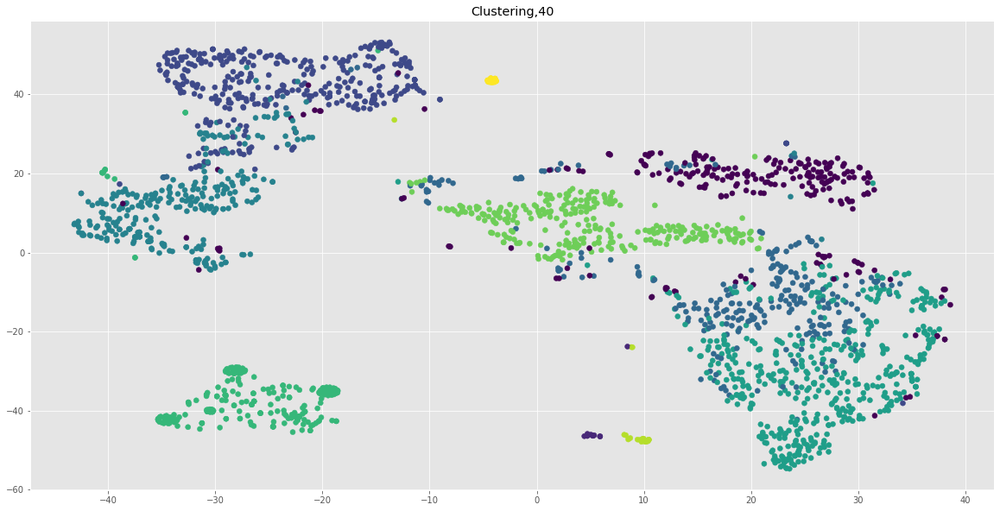

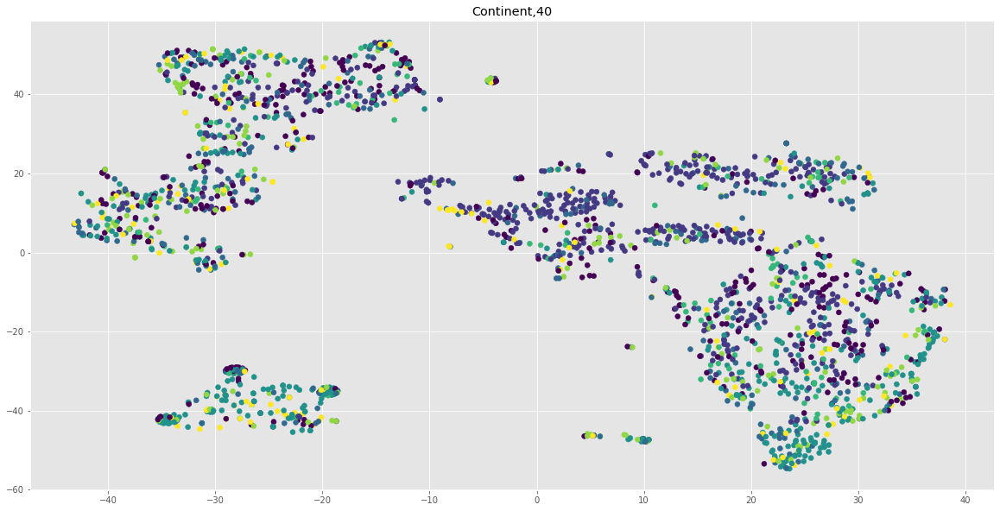

In [337]:
color_embeddings_big(TSNE_ALL_EMBEDDING[2:3],[labelling,cont_color_all],["Clustering","Continent"],["40"],(20,10))

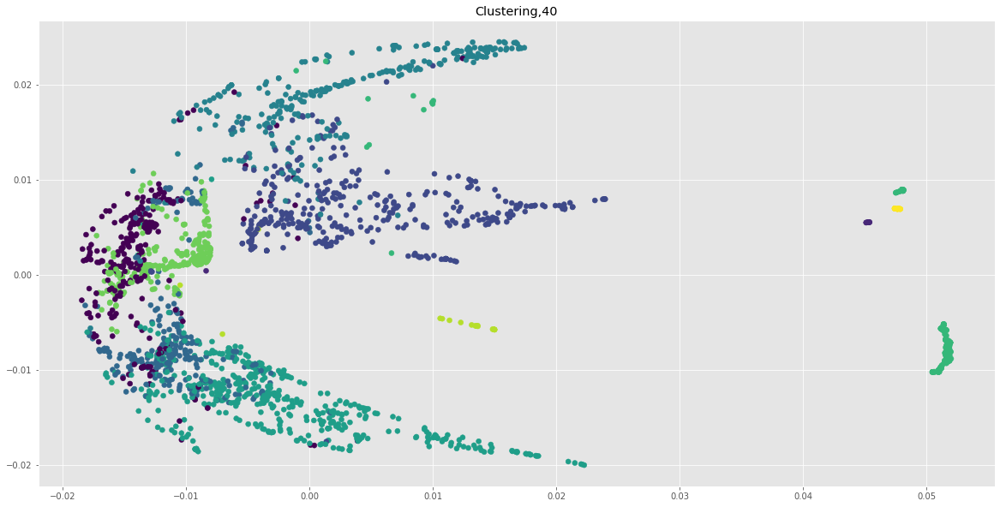

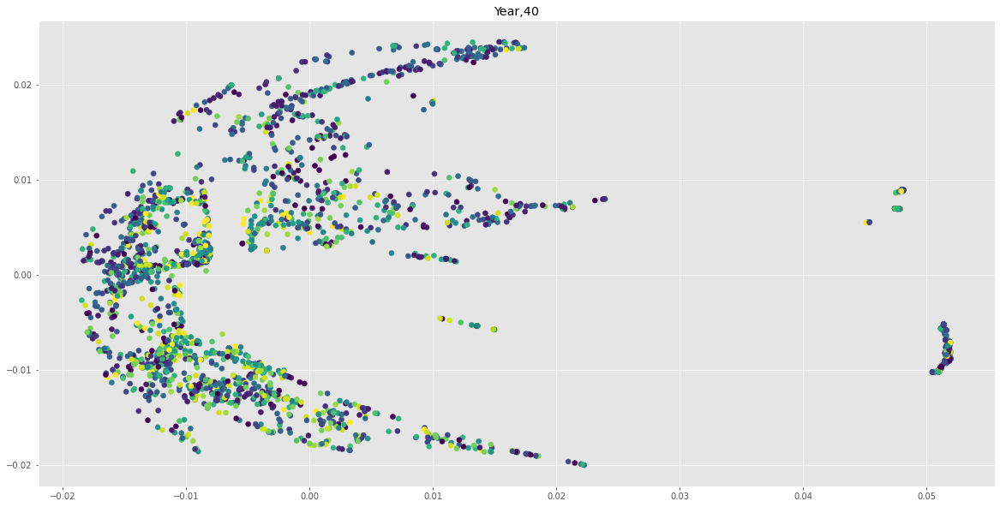

In [341]:
color_embeddings_big(PHATE_ALL_EMBEDDING[1:2],[labelling,year_color_all],["Clustering","Year"],["40"],(20,10))

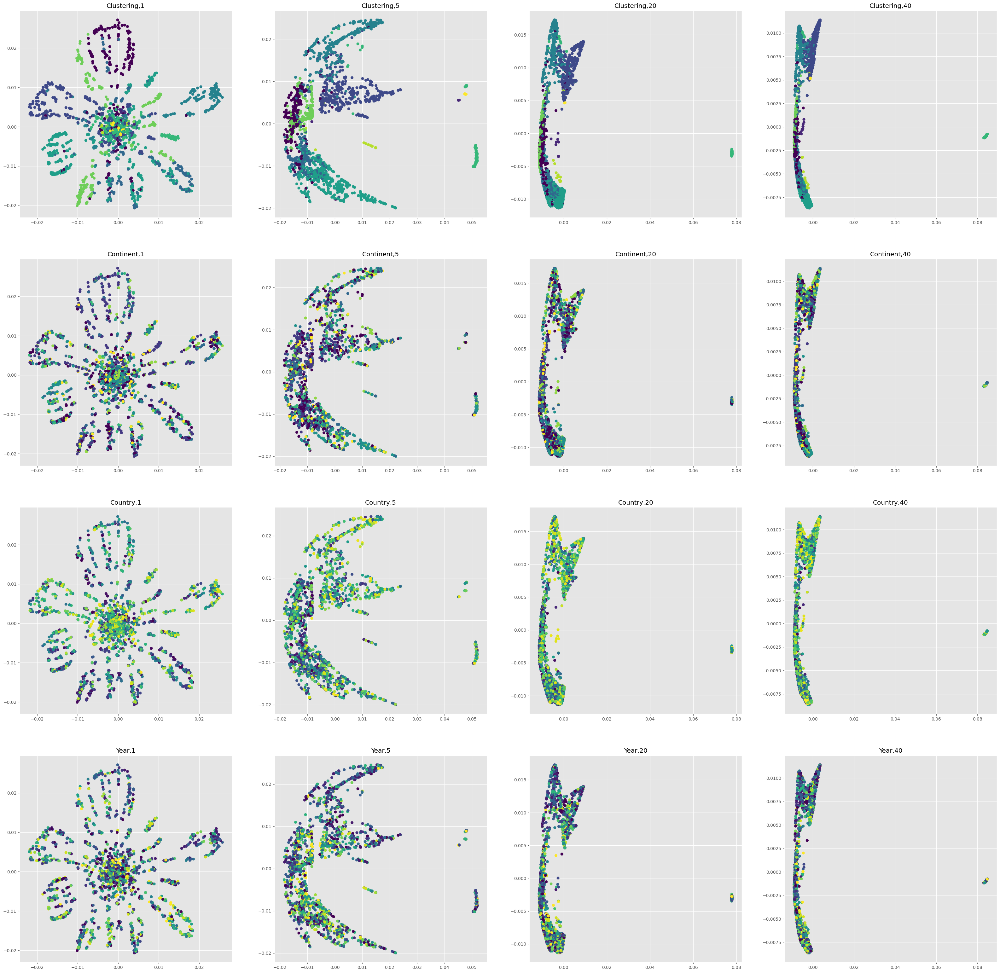

In [275]:
color_embeddings(PHATE_ALL_EMBEDDING,[labelling,cont_color_all,count_color_all,year_color_all],["Clustering","Continent","Country","Year"],["1","5","20","40"])

## Visualizing Histograms by Country ##

In [162]:
lst_of_country = sorted([x for x in list(set(acronym_to_country.values())) if str(x) != 'nan'])
lst_of_country

['Afghanistan',
 'Albania',
 'Algeria',
 'American Samoa',
 'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas, The',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'British Virgin Islands',
 'Brunei Darussalam',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cayman Islands',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 'Cook Islands',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Curacao',
 'Cyprus',
 'Czech Republic',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt, Arab Rep.',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Gambia, The',
 'Georgia',
 'Germany',
 

In [223]:
#maybe graph how player profiles change over time...
def graph_player_histograms_over_time(country_name):
    list_of_keys = []
    for i in range(0, len(list_of_country_year)):
        key = list_of_country_year[i]
        if key[0] == country_name:
            list_of_keys.append(key)
    
    sorted_list_by_year = sorted(list_of_keys, key = lambda x: x[1])
    
    
    %matplotlib inline
    import matplotlib.pyplot as plt
    import math 
    
    plt.style.use('ggplot')
    _, plots = plt.subplots(math.ceil(len(sorted_list_by_year)/4), 4, figsize = (20,5))
    
    row_count = -1
    for index, key in enumerate(sorted_list_by_year):
        if index % 4 == 0:
            row_count += 1
        hist_info = olympic_data_dict_hist[key]
        plots[row_count][index%4].bar(x=[i for i in range(0, len(hist_info))], height=hist_info)
        plots[row_count][index%4].set_title(key[0] + "," + key[1])
    
    plt.show()  

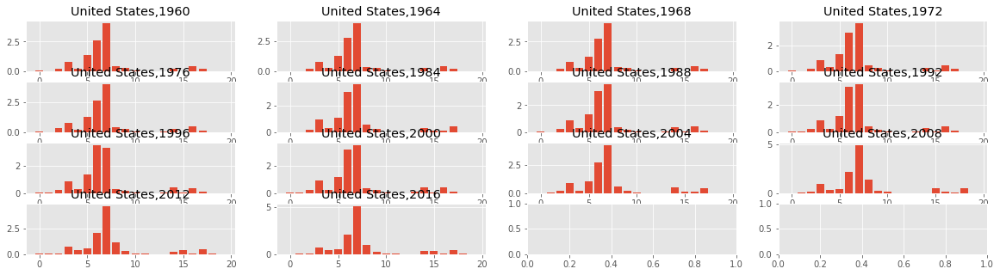

In [224]:
graph_player_histograms_over_time("United States")

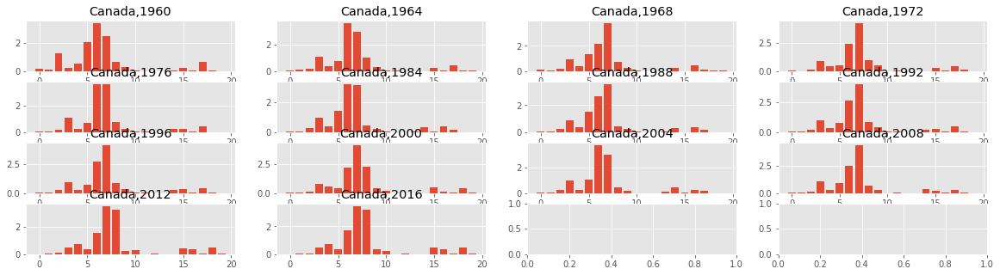

In [330]:
graph_player_histograms_over_time("Canada")

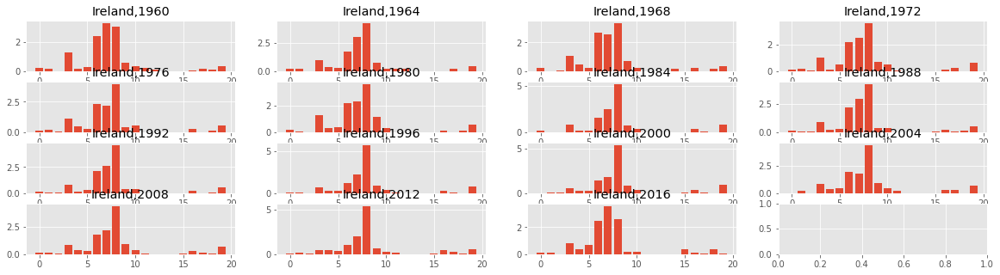

In [283]:
graph_player_histograms_over_time("Ireland")

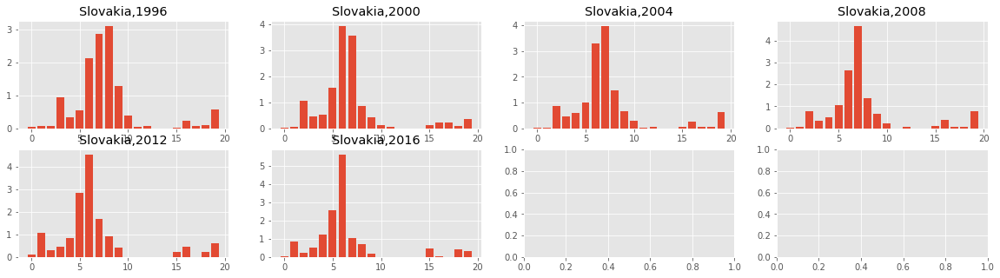

In [284]:
graph_player_histograms_over_time("Slovakia")

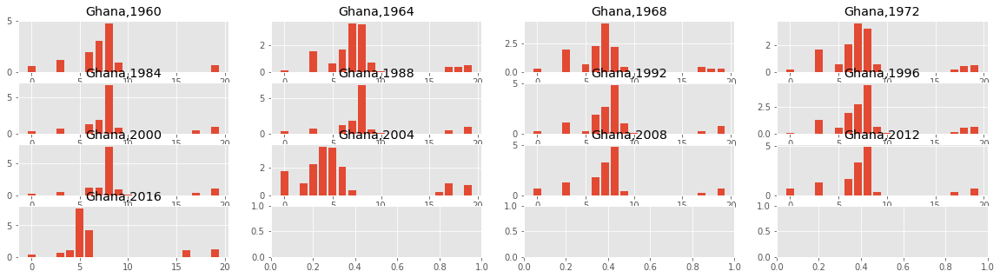

In [286]:
graph_player_histograms_over_time("Ghana")

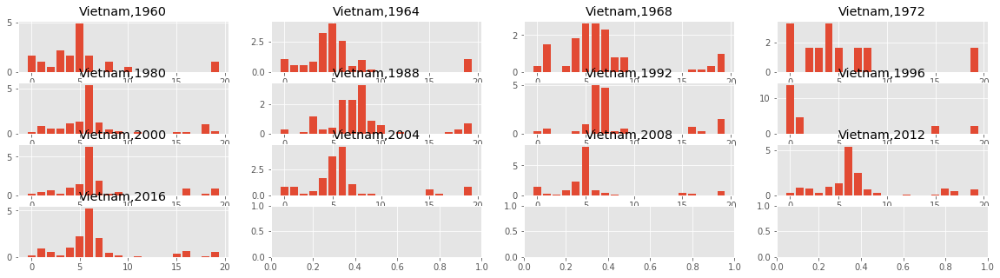

In [287]:
graph_player_histograms_over_time("Vietnam")

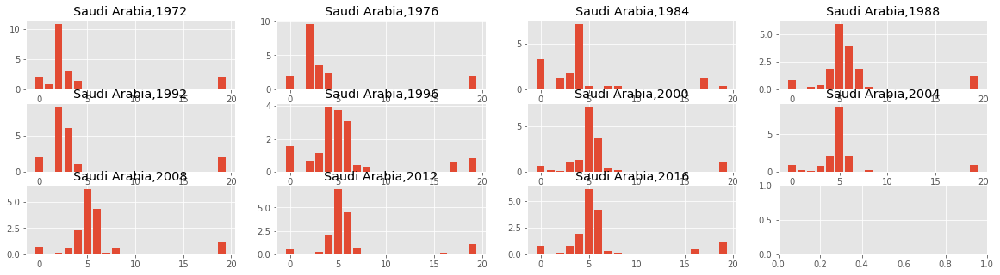

In [288]:
graph_player_histograms_over_time("Saudi Arabia")

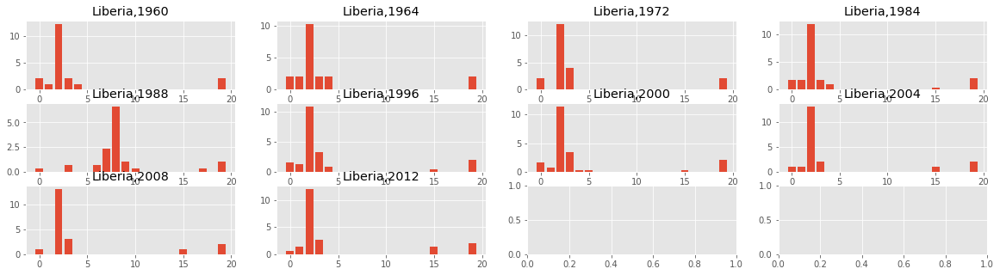

In [289]:
graph_player_histograms_over_time("Liberia")

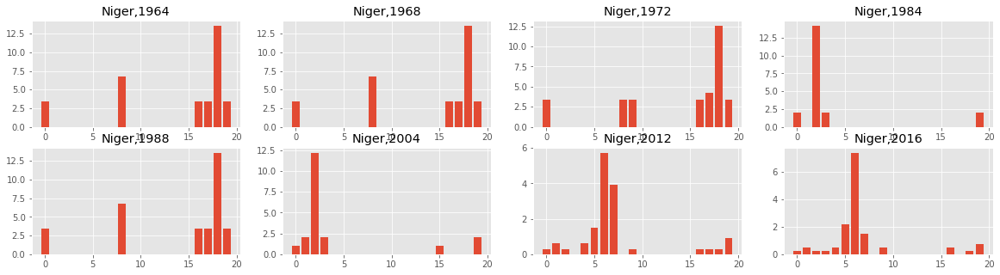

In [290]:
graph_player_histograms_over_time("Niger")

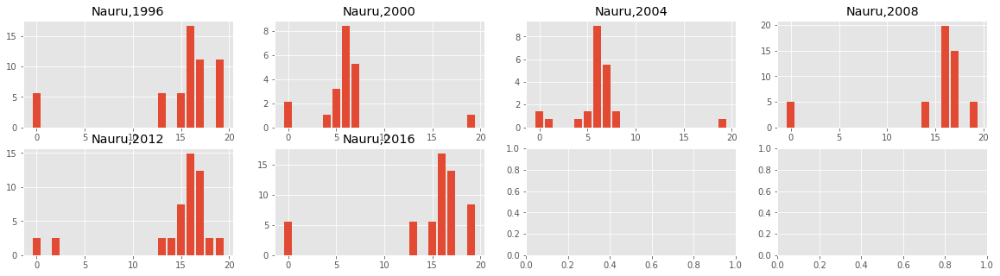

In [291]:
graph_player_histograms_over_time("Nauru")

## Running k-means, tSNE, PHATE by Year ##


In [278]:
def compute_per_year(year):
    year_data, year_points = get_points_by_year(year)
    year_labelling = kmeans(year_data, 10)
    tsne_embed_year = get_tsne_embeddings([2,10,40,100],year_data)
    phate_embed_year= get_phate_embeddings([1,5,20,40],year_data)
    cont_year, dict_cont_color_all = color_by_continent(year_points)
    count_year, dict_count_color_all = color_by_country(year_points)
    print("TSNE")
    color_embeddings(tsne_embed_year,[year_labelling,cont_year,count_year],["Clustering","Cont","Country"],["2","10","40","100"],default=False)
    print("PHATE")
    color_embeddings(phate_embed_year,[year_labelling,cont_year,count_year],["Clustering","Cont","Country"],["1","5","20","40"],default=False)
    print_clusters(year_labelling, year_points)

  3%|▎         | 8/300 [00:03<02:18,  2.11it/s]
4it [00:11,  2.78s/it]
4it [00:00,  5.15it/s]


TSNE


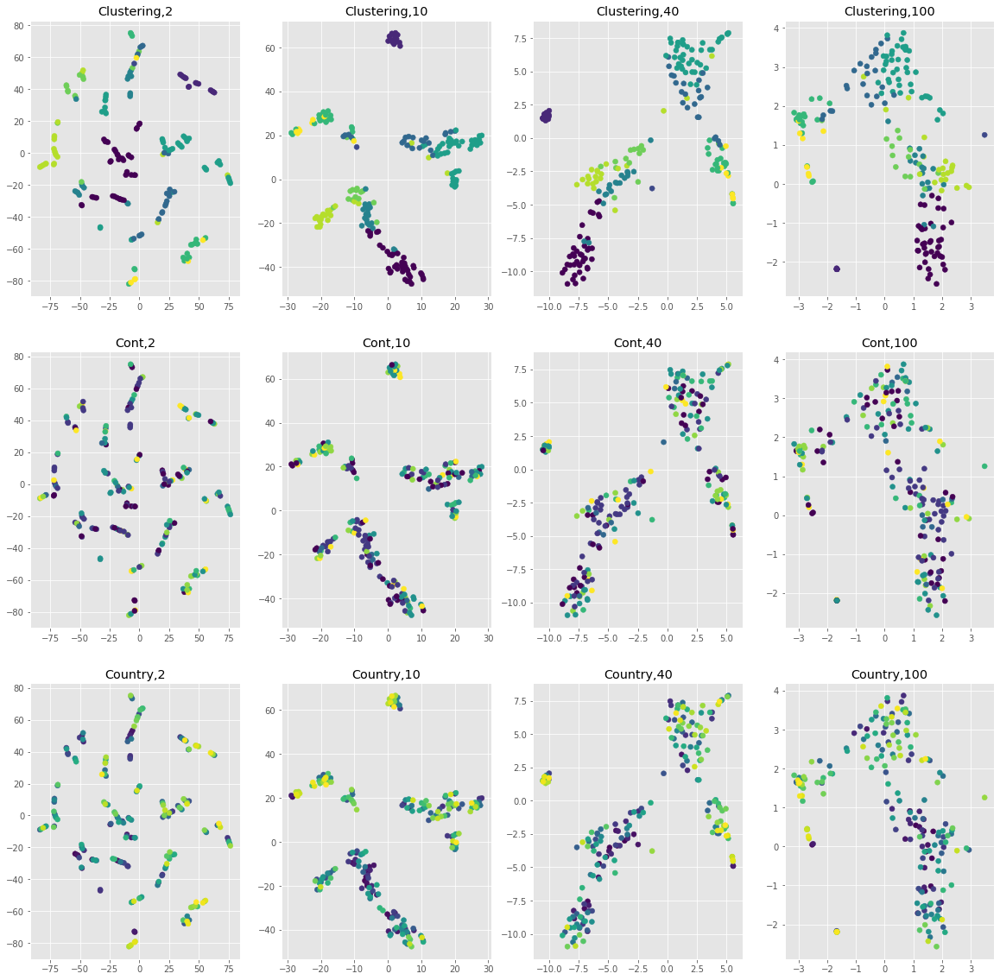

PHATE


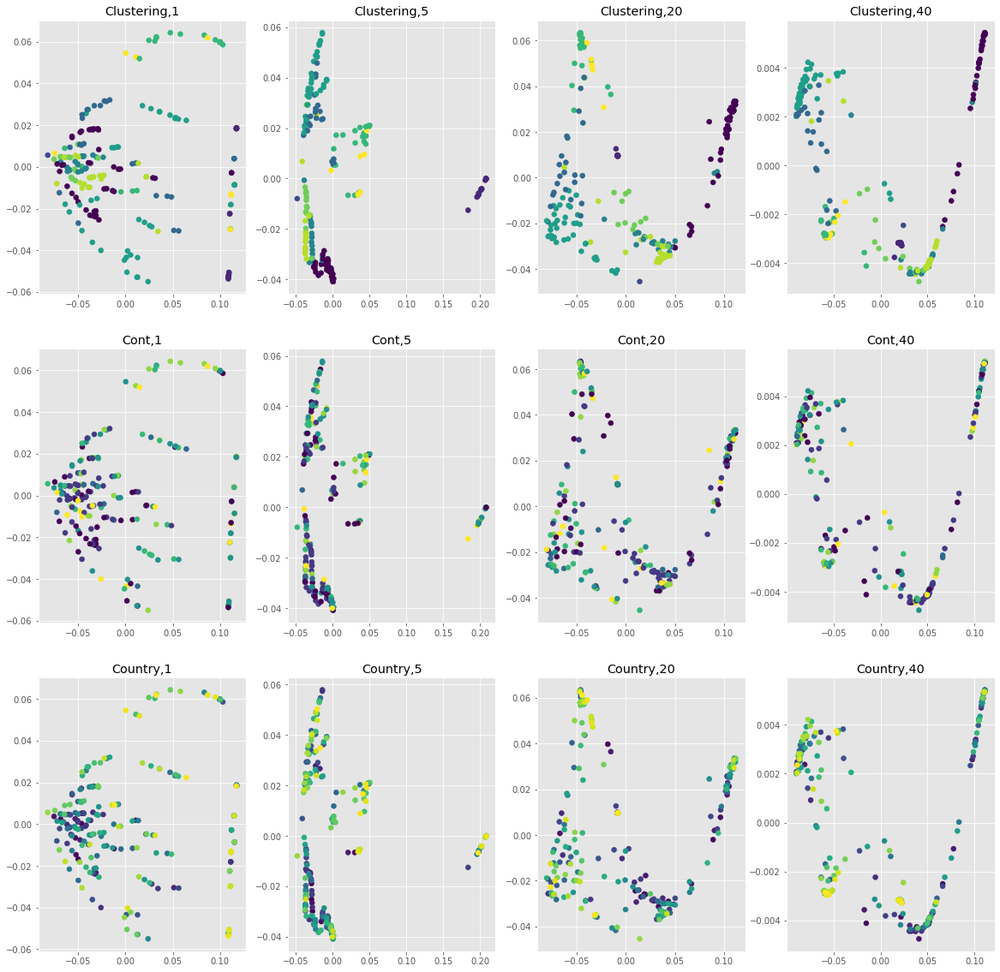

++
||
++
++
+--------------------------+---------------------------------+--------------------------------+
|        Cluster:4         |            Cluster:0            |           Cluster:6            |
+--------------------------+---------------------------------+--------------------------------+
|      Armenia(2012)       |        Afghanistan(2012)        |        Bangladesh(2012)        |
|       Brazil(2012)       |          Algeria(2012)          |         Barbados(2012)         |
|       Canada(2012)       |         Argentina(2012)         |          Belize(2012)          |
|       China(2012)        |         Azerbaijan(2012)        |         Bermuda(2012)          |
|      Colombia(2012)      |          Belarus(2012)          |      Cayman Islands(2012)      |
|   Czech Republic(2012)   |           Benin(2012)           | Central African Republic(2012) |
|  Egypt, Arab Rep.(2012)  |          Bulgaria(2012)         |          Haiti(2012)           |
|       France(2012)       |

In [279]:
compute_per_year("2012")

  2%|▏         | 5/300 [00:04<04:03,  1.21it/s]
4it [00:08,  2.10s/it]
4it [00:00, 11.76it/s]


TSNE


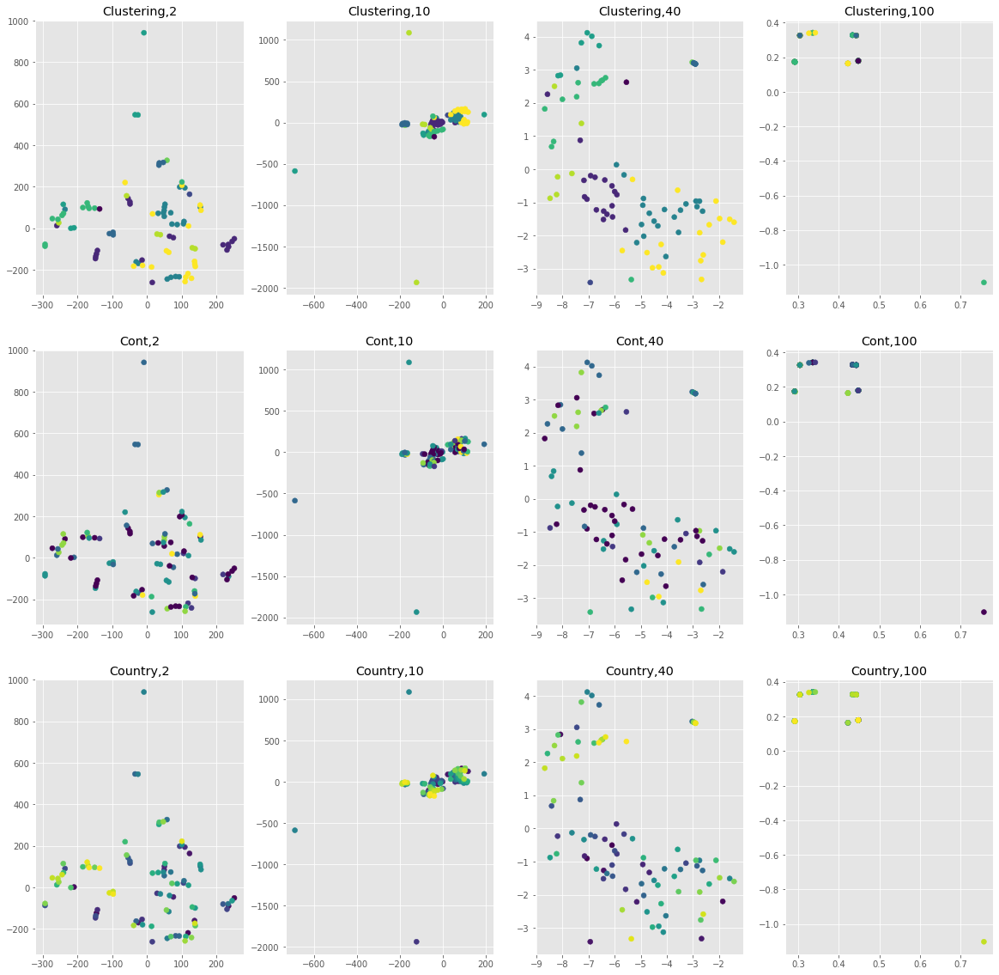

PHATE


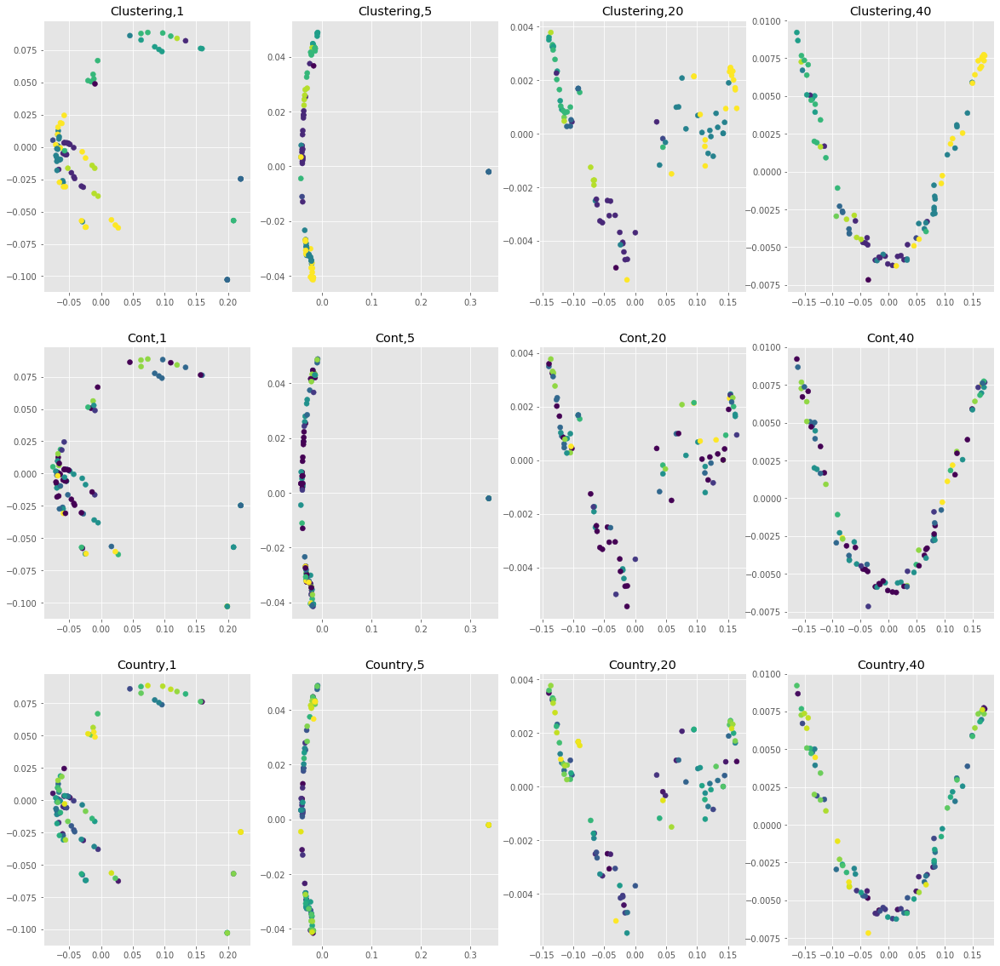

++
||
++
++
+--------------------------+---------------------------------+---------------------+
|        Cluster:1         |            Cluster:9            |      Cluster:5      |
+--------------------------+---------------------------------+---------------------+
|     Australia(1976)      |          Andorra(1976)          |     India(1976)     |
|      Bulgaria(1976)      |        Bahamas, The(1976)       |     Kuwait(1976)    |
|       Canada(1976)       |          Bermuda(1976)          | Liechtenstein(1976) |
|        Cuba(1976)        |     Dominican Republic(1976)    |    Malaysia(1976)   |
|      Denmark(1976)       |           Haiti(1976)           |    Pakistan(1976)   |
|       France(1976)       |         Indonesia(1976)         |      Peru(1976)     |
|      Germany(1976)       |          Jamaica(1976)          |                     |
|      Hungary(1976)       | Korea, Dem. People’s Rep.(1976) |                     |
|       Israel(1976)       |        Korea, Rep.(1976)

In [280]:
compute_per_year("1976")

## Coloring by Economic/Developmental clusterings ##

In [297]:
#data from economic
economic_coloring = pickle.load( open( "coloring_economic.p", "rb" ) )

In [327]:
#generate enw coloring

coloring_economic_olympic = []
for index in lst_of_points:
    key = list_of_country_year[index]
    if key not in economic_coloring:
        coloring_economic_olympic.append(0)
        continue 
    coloring_economic_olympic.append(economic_coloring[key]) 

In [299]:
economic_list_key = list(economic_coloring.keys())
lst_of_labels = []
for i in range(0, len(economic_list_key)):
    key = economic_list_key[i]
    lst_of_labels.append(economic_coloring[key])

In [312]:
def print_clusters_non():
    cluster_dict = defaultdict(list)
    
    filtered_list = []
    for val in economic_list_key:
        if int(val[1])%4==0 and val[0] in lst_of_country:
            filtered_list.append(val)
            
    for key in filtered_list:
        cluster_id = economic_coloring[key]
        cluster_dict[cluster_id].append(key)
        
    max_length_column = 0 
    for key in cluster_dict:
        max_length_column = max(max_length_column, len(cluster_dict[key]))
        
    counter = 0
    my_table = PrettyTable()
    for key in cluster_dict:
        
        if counter % 2 == 0:
            print(my_table)
            my_table = PrettyTable()
        
        lst_of_countries = cluster_dict[key]
        lst_of_countries = sorted(lst_of_countries, key = lambda x: int(x[1]))
        lst_of_countries = sorted(lst_of_countries, key = lambda x: str(x[0]))
        
        for i in range(0,len(lst_of_countries)):
            lst_of_countries[i] = str(lst_of_countries[i][0])+"({})".format(lst_of_countries[i][1])
        
        num_null_pads = max_length_column-len(lst_of_countries)
        for i in range(num_null_pads):
            lst_of_countries.append("")
            
        my_table.add_column("Cluster:"+str(key),lst_of_countries)
        
        counter +=1 

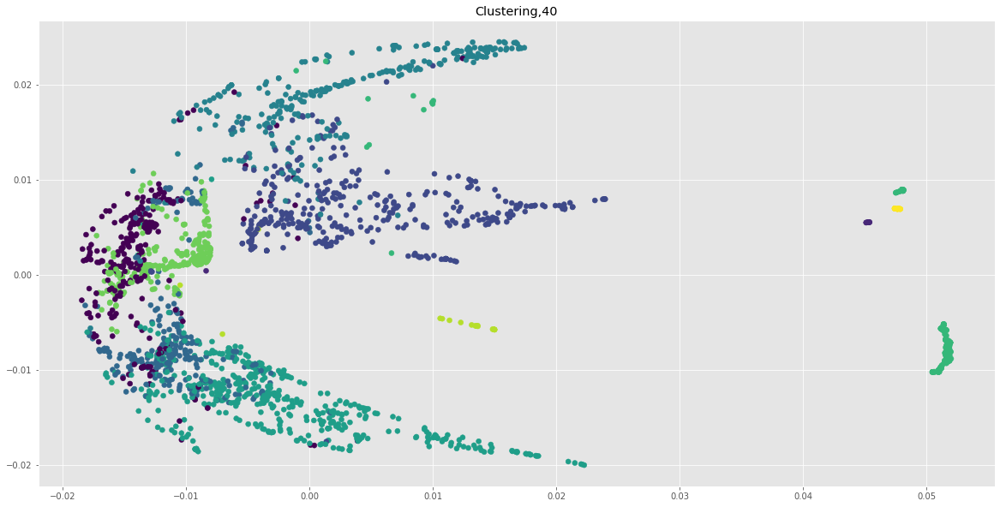

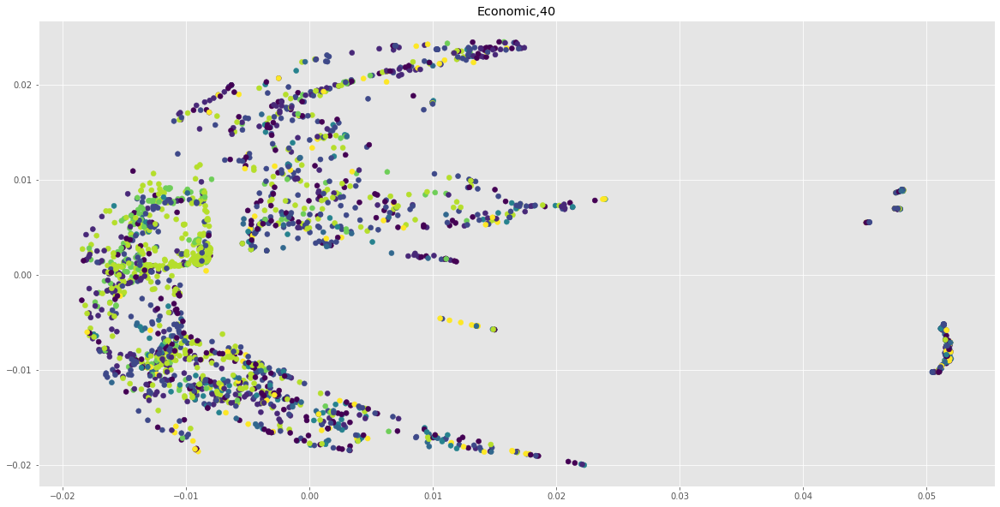

In [342]:
color_embeddings_big(PHATE_ALL_EMBEDDING[1:2],[labelling,coloring_economic_olympic],["Clustering","Economic"],["40"],(20,10))

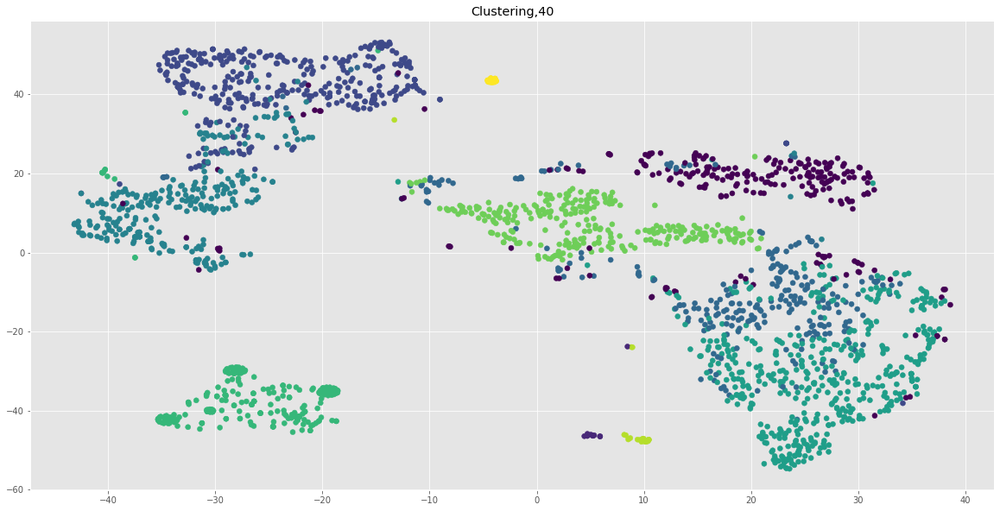

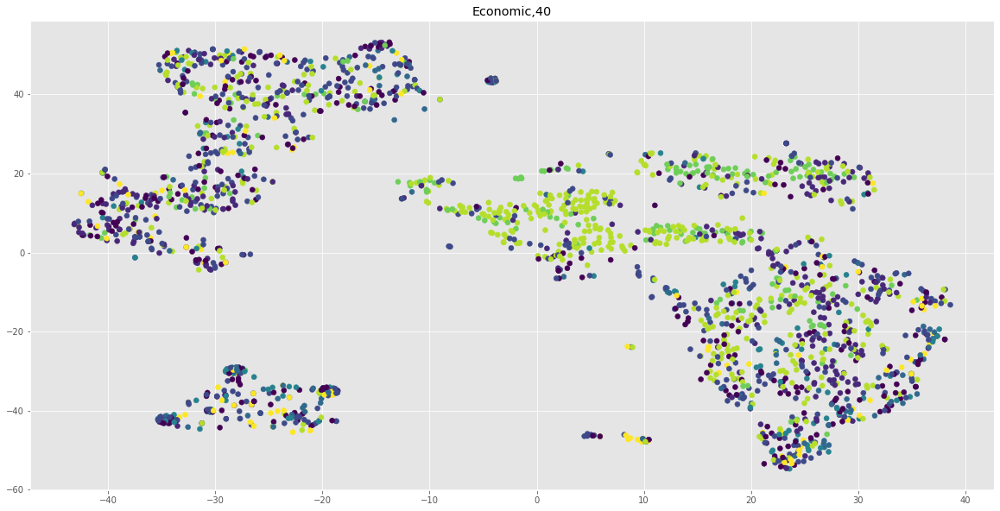

In [343]:
color_embeddings_big(TSNE_ALL_EMBEDDING[2:3],[labelling,coloring_economic_olympic],["Clustering","Economic"],["40"],(20,10))

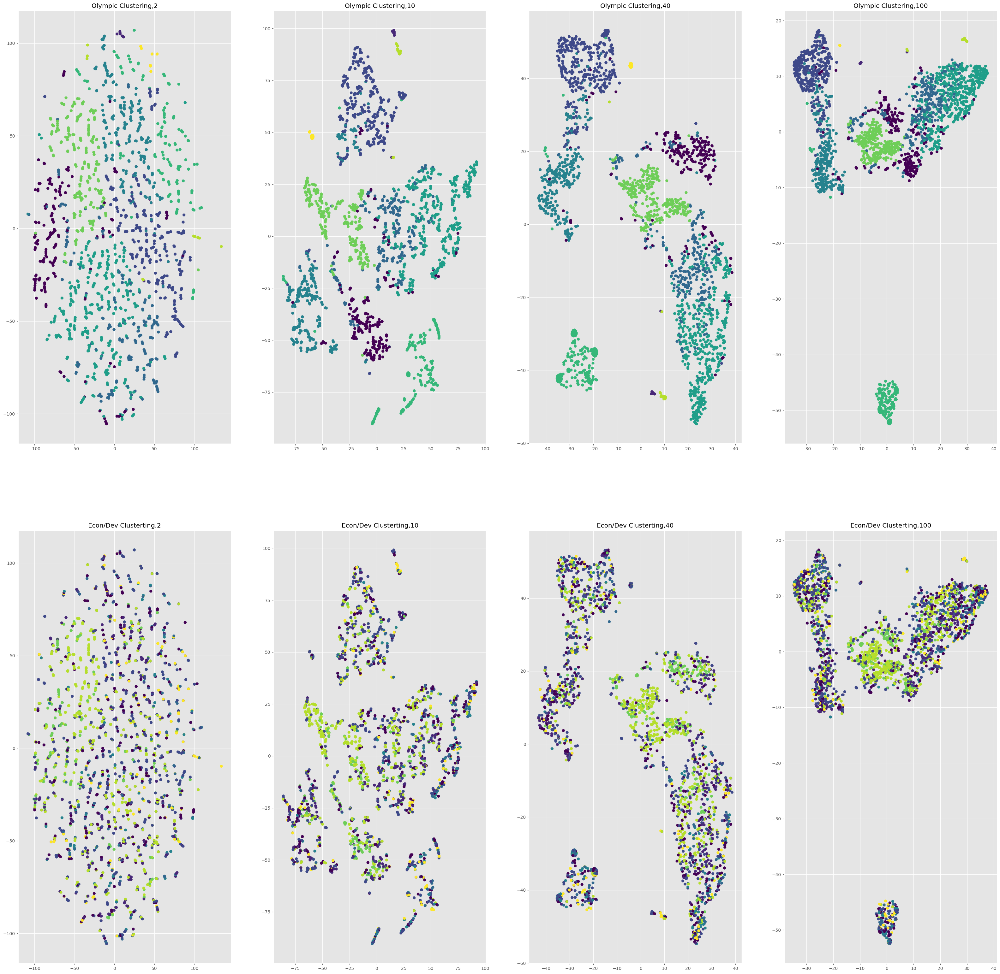

In [328]:
color_embeddings(TSNE_ALL_EMBEDDING,[labelling,coloring_economic_olympic],["Olympic Clustering","Econ/Dev Clusterting"],["2","10","40","100"])

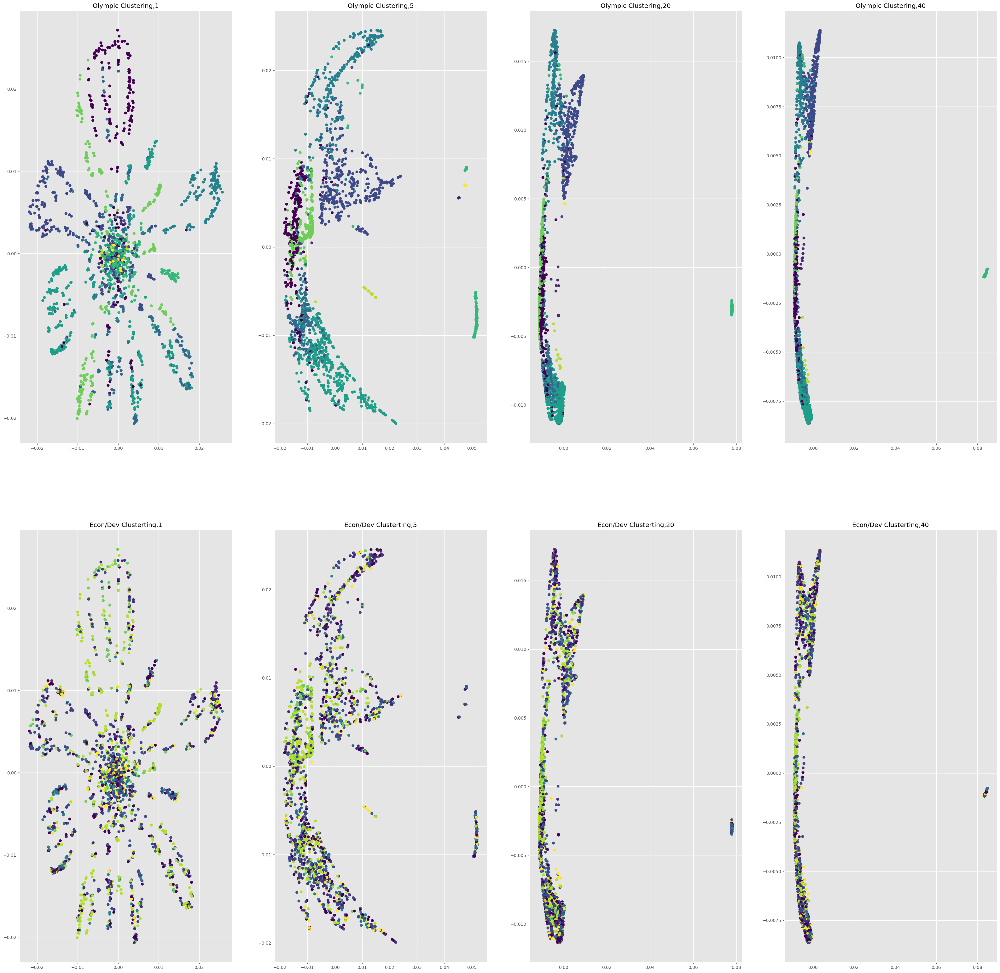

In [329]:
color_embeddings(PHATE_ALL_EMBEDDING,[labelling,coloring_economic_olympic],["Olympic Clustering","Econ/Dev Clusterting"],["1","5","20","40"])

## Printing clusters, top: economic indicators, bottom: Olympic ##

In [313]:
print_clusters_non()

++
||
++
++
+--------------------------------------+--------------------------------------+
|              Cluster:2               |              Cluster:8               |
+--------------------------------------+--------------------------------------+
|          Afghanistan(2016)           |            Albania(1980)             |
|          Afghanistan(2020)           |            Albania(1984)             |
|            Albania(1960)             |            Albania(1988)             |
|            Albania(1964)             |            Albania(1992)             |
|            Albania(1968)             |            Albania(1996)             |
|            Albania(1972)             |            Albania(2000)             |
|            Albania(1976)             |            Albania(2004)             |
|            Albania(2020)             |            Algeria(1996)             |
|            Algeria(1984)             |            Algeria(2000)             |
|            Algeria(1988)  

+--------------------------------------+----------------------------+
|              Cluster:1               |         Cluster:7          |
+--------------------------------------+----------------------------+
|            Albania(2008)             |        Aruba(2008)         |
|            Albania(2012)             |        Aruba(2012)         |
|            Albania(2016)             |      Australia(1996)       |
|            Algeria(2008)             |      Australia(2004)       |
|            Algeria(2012)             |      Australia(2008)       |
|            Algeria(2016)             |      Australia(2012)       |
|            Andorra(2008)             |      Australia(2016)       |
|            Andorra(2016)             |       Austria(2000)        |
|      Antigua and Barbuda(1992)       |       Austria(2004)        |
|      Antigua and Barbuda(2000)       |       Austria(2008)        |
|      Antigua and Barbuda(2004)       |       Austria(2012)        |
|      Antigua and B

+--------------------------------------+--------------------------------------+
|              Cluster:0               |              Cluster:3               |
+--------------------------------------+--------------------------------------+
|          Afghanistan(1960)           |          Afghanistan(1964)           |
|          Afghanistan(2012)           |          Afghanistan(1968)           |
|            Algeria(1980)             |            Algeria(1960)             |
|             Angola(2012)             |            Algeria(1964)             |
|      Antigua and Barbuda(1960)       |            Algeria(1968)             |
|      Antigua and Barbuda(1964)       |             Angola(1960)             |
|      Antigua and Barbuda(1968)       |             Angola(1964)             |
|            Bahrain(1960)             |             Angola(1968)             |
|            Bahrain(1964)             |             Angola(1976)             |
|            Bahrain(1968)             |

In [314]:
print_clusters(labelling, lst_of_points)

++
||
++
++
+---------------------------------+---------------------------------+-----------------------------------+
|            Cluster:7            |            Cluster:3            |             Cluster:0             |
+---------------------------------+---------------------------------+-----------------------------------+
|          Algeria(1968)          |          Algeria(1980)          |         Afghanistan(1980)         |
|         Argentina(1960)         |          Algeria(1996)          |           Algeria(1964)           |
|         Argentina(1964)         |          Algeria(2016)          |           Andorra(1976)           |
|          Armenia(1996)          |           Angola(1980)          |           Andorra(1992)           |
|          Armenia(2012)          |         Argentina(1968)         |           Andorra(1996)           |
|         Australia(1960)         |         Argentina(1972)         |            Angola(2016)           |
|         Australia(1964)         

+--------------------------------------+------------------------+------------------+
|              Cluster:6               |       Cluster:8        |    Cluster:1     |
+--------------------------------------+------------------------+------------------+
|         American Samoa(2008)         |      Benin(1972)       |   Bhutan(1988)   |
|      Antigua and Barbuda(1976)       |      Benin(1980)       |   Bhutan(1996)   |
|           Bangladesh(1984)           |      Benin(1984)       | Costa Rica(1964) |
|           Bangladesh(1992)           |     Bolivia(1964)      |  Curacao(1960)   |
|           Bangladesh(1996)           |     Curacao(1964)      |   Guinea(1984)   |
|             Belize(1996)             | Egypt, Arab Rep.(1976) |   Monaco(1964)   |
|             Belize(2000)             |      Gabon(1972)       |   Nauru(1996)    |
|             Belize(2004)             |       Iraq(1992)       |   Nauru(2008)    |
|             Benin(1996)              |       Mali(1984)       |